# **Correlation analysis of the sensitivity values**

## Navigation

- [**Basic imports and initialization**](#Basic-imports-and-initialization)
- [**1. Alexnet**](#1.-Alexnet)
- [**2. ResNet18**](#2.-ResNet18)

## Basic imports and initialization

$\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#1.-Alexnet)

- [Limiting the hardware resources, importing packages](#Limiting-the-hardware-resources,-importing-packages)
- [Initializing common variables](#Initializing-common-variables)

In [1]:
notebook_directory_offset = '../'

### Limiting the hardware resources, importing packages

$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$[[Next subsect.$\to$]](#Initializing-common-variables)

To provide easy access to modules stored in the ```../src/``` directory, we use the following workaround:

In [1]:
import os
import sys
sys.path.append(
    os.path.join(notebook_directory_offset, '../src/')
)

Next, we limit the hardware usage:

In [2]:
# set limitations on hardware
import hardware_setup
hardware_setup.mkl_set_num_threads(num_threads=4)

[mkl]: set up num_threads=4/4


Then we import all necessary packages:

In [3]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import correlation.compute
import correlation.visualize

import sensitivity_analysis.preprocess_visualize
import sensitivity_analysis.augmentation_setting

import preparation.single_unit

### Initializing common variables

[[$\leftarrow$Prev.subsect.]](#Limiting-the-hardware-resources,-importing-packages)$\quad$[[Back to section]](#Basic-imports-and-initialization)$\quad$

In [4]:
dataset_name = 'places365'
data_dirname = f'../data/{dataset_name}'
activations_dirname = '../results/'

model_dirname = '../torch-models/'
exp_relative_path = '../experiments/'

values_fnm_base = f'{dataset_name}_values'
augmentation_set_numbers_list = (1, 2)

In [5]:
values_names_list = (
    'rbscc (train)',
    'rbscc (valid)',
    'shpv',
    'si',
    'siT'
)
values_names_list_2 = (
    'shpv',
    'si',
    'siT'
)

values_cov_pairs_dict = {
    'shpv': 'shptv',
    'si': 'sitv',
    'siT': 'sitv'
}
cov_values_names_dict = {
    'sitv': ('var', 'mean'),
    'shptv': ('var', 'mean'),
    #'sitv': 'var',
    #'shptv': 'var',
}
cov_values_funcs = {
    'sitv': {
        'mean': None,
        'var': None,
        ('var', 'mean'): (
            lambda x: sensitivity_analysis.preprocess_visualize.compute_coef_var(
                x, log=False
            )
        ),
    },
    'shptv': {
        'means': None,
        'var': None,
        ('var', 'mean'): (
            lambda x: sensitivity_analysis.preprocess_visualize.compute_coef_var(
                x, log=False
            )
        ),
    }
}


shpv_group_indices_dict = {}
for augmentation_set_number in augmentation_set_numbers_list:
    shpv_group_indices_dict[
        augmentation_set_number
    ] = sensitivity_analysis.augmentation_setting.get_group_variables_indices(
        augmentation_set_number,
        use_permutation_variable=True,
        use_class_variable=True,
        use_partition_variable=True
    )


In [7]:
#corr_type = 'pearson'
corr_type = 'spearman'

show = True
plot_colorbar = True

#figsize_corr = (18, 5)
figsize_corr = (28, 5)
figsize_corr_hist = (20, 3)
figsize_corr_consolidated = (18, 4)

cmap_corr = 'RdBu_r'
cmap_corr_consolidated = 'twilight'
color_cumul = 'salmon'
color_bins = 'firebrick'
cmap_cross_corr_consolidated = 'twilight_shifted'
cmap_cvs_consolidated = 'twilight_shifted_r'

figsize_cross_corr = (14, 6)
#figsize_cross_corr = (25, 7.5)
figsize_cross_corr_hist = (12, 3)
figsize_cross_corr_consolidated = (18, 4)

figsize_cvs_corr = (25, 4)
figsize_cvs_consolidated = (25, 4)

## 1. Alexnet

[[$\leftarrow$ Prev.part]](#Basic-imports-and-initialization) $\qquad$ [[Back to top]](#Navigation) $\qquad$ [[Next part $\to$]](#2.-VGG11)


- [1.1 Setting up the configuration variables](#1.1-Setting-up-the-configuration-variables)
- [1.2 Correlation between pairs of augmentation variables within selected sensitivity values](#1.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)
- [1.3 Cross-correlations between paired sensitivity values](#1.3-Cross-correlations-between-paired-sensitivity-values)
- [1.4 Correlations between sensitivity values and corresponding coefficients of variations](#1.4-Correlations-between-sensitivity-values-and-corresponding-coefficients-of-variations)

### 1.1 Setting up the configuration variables

$\quad$ [[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)

In [8]:
network_name = 'alexnet'
alexnet_network_modules = [
    'features.2', # Conv2d + ReLU + MaxPool2d
    'features.5', # ... + Conv2d + ReLU + MaxPool2d
    'features.7', # ... + Conv2d + ReLU
    'features.9', # ... + Conv2d + ReLU
    #'features.12', # ... + Conv2d + ReLU + MaxPool2d
    'avgpool', # ... + Conv2d + ReLU + MaxPool2d + AdaptiveAvgPool
    'classifier.2', # ... + Linear + ReLU
    'classifier.5', # ... + Linear + ReLU
    'classifier.6', # ... + Linear
]
alexnet_n_conv_modules = len(
    list(filter(lambda x: ('features' in x) or ('avgpool' in x), alexnet_network_modules))
)

alexnet_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

### 1.2 Correlation between pairs of augmentation variables within selected sensitivity values

[[$\leftarrow$Prev.subsect.]](#1.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.3-Cross-correlations-between-paired-sensitivity-values)

- [1.2.1 Space-wise means](#1.2.1-Space-wise-means)
- [1.2.2 Histograms of the (space-wise) standard deviations](#1.2.2-Histograms-of-the-(space-wise)-standard-deviations)
- [1.2.3 Consolidated summary plots](#1.2.3-Consolidated-summary-plots)

In [9]:
alexnet_cormat_means, alexnet_cormat_std, augmentation_names, alexnet_cormat_nans = (
    correlation.visualize.get_paired_correlations_fixed_values(
        alexnet_values_fnms_dict,
        os.path.join(notebook_directory_offset, activations_dirname),
        alexnet_network_modules,
        values_names_list,
        augmentation_set_numbers_list,
        shpv_group_indices_dict,
        alexnet_n_conv_modules,
        corr_type=corr_type,
        extract_auxilliary_names=False,
        nan_mask_policy='any',
    )
)

#### 1.2.1 Space-wise means

[[Back to subsection]](#1.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)

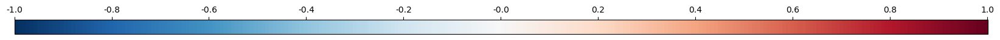


			features.2



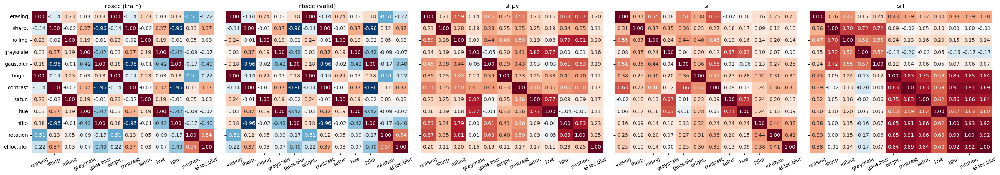


			features.5



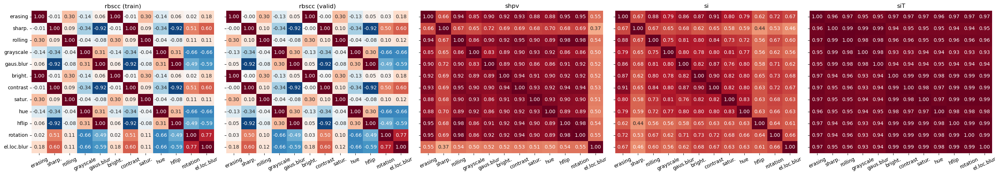


			features.7



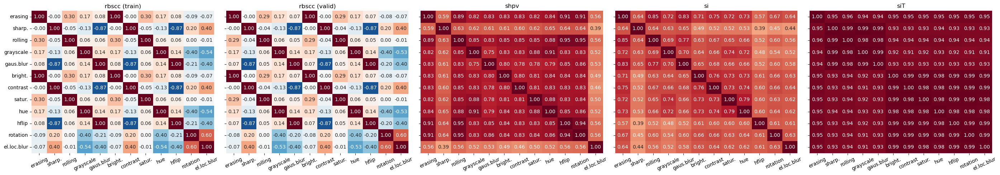


			features.9



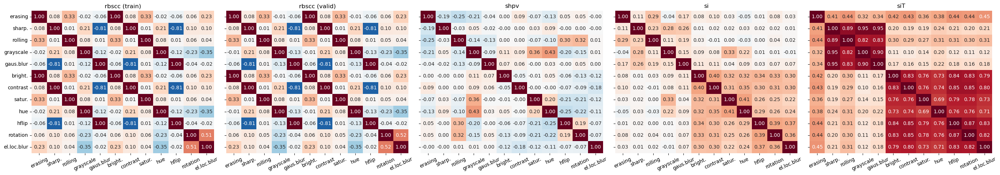


			avgpool



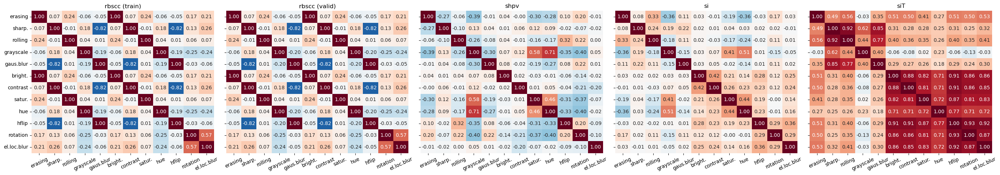


			classifier.2



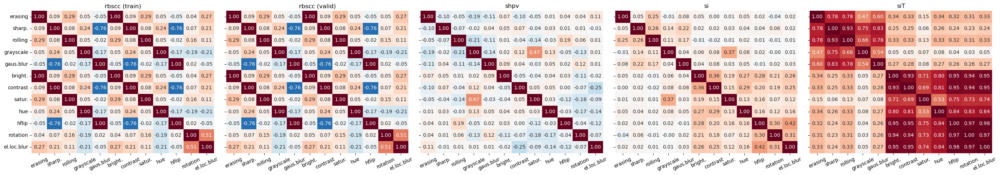


			classifier.5



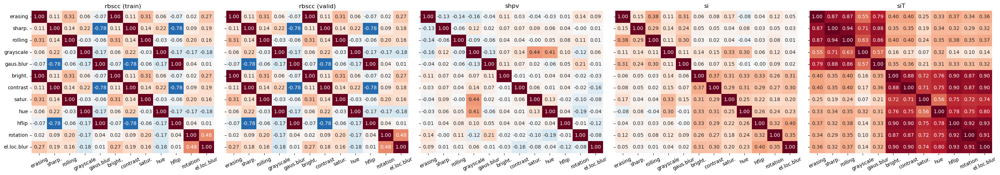


			classifier.6



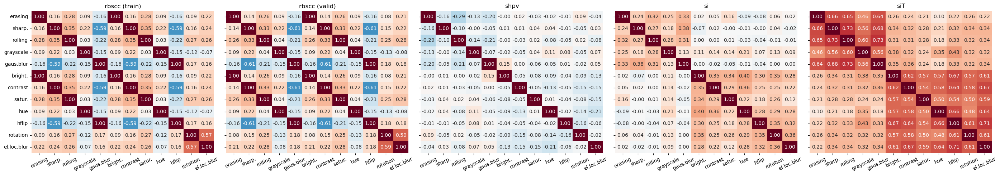

In [10]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{network_name}_{dataset_name}/spacewise_mean_cormat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'spacewise_mean_cormat'


correlation.visualize.plot_paired_correlations_fixed_values(
    alexnet_cormat_means,
    augmentation_names,
    alexnet_network_modules,
    values_names_list,
    figsize=figsize_corr,
    plot_colorbar=True,
    show=show,
    cmap=cmap_corr,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

#### 1.2.2 Histograms of the (space-wise) standard deviations

[[Back to subsection]](#1.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)


			features.2



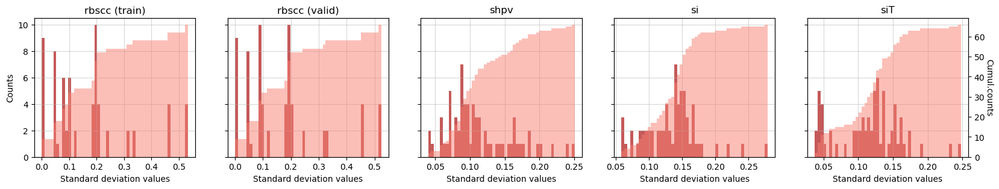


			features.5



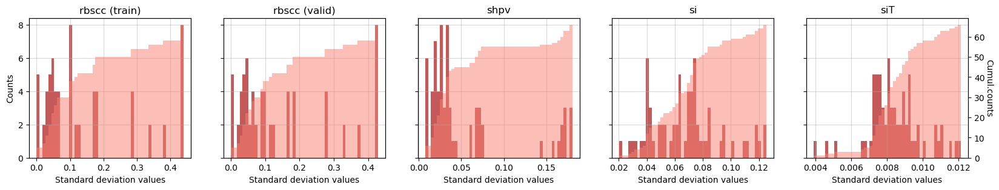


			features.7



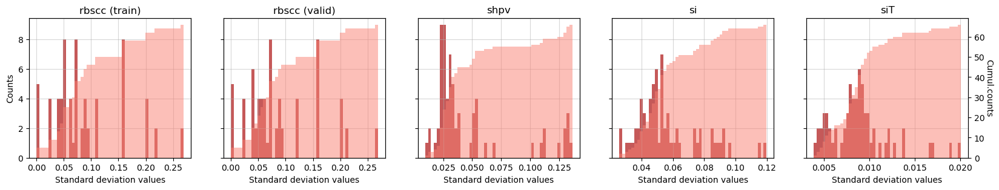


			features.9



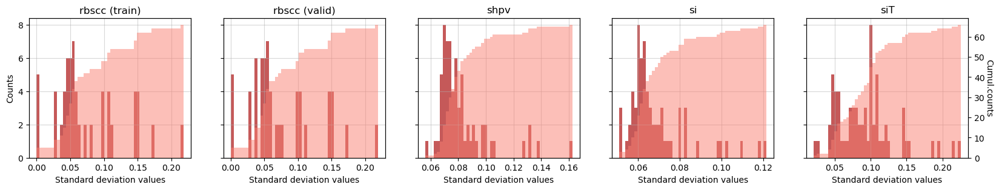


			avgpool



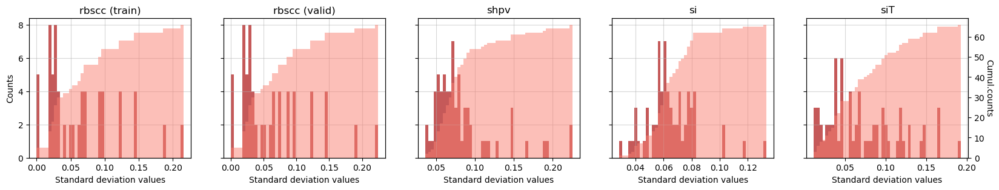

In [11]:
correlation.visualize.plot_hist_std_paired_correlations_fixed_values(
    alexnet_cormat_std,
    augmentation_names,
    alexnet_network_modules,
    values_names_list,
    alexnet_n_conv_modules,
    figsize=figsize_corr_hist,
    show=show,
    color_cumul=color_cumul,
    color_bins=color_bins,
)

#### 1.2.3 Consolidated summary plots

[[Back to subsection]](#1.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)

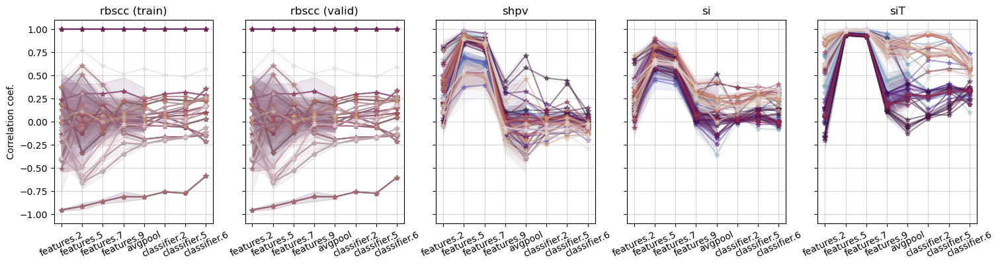

In [12]:
correlation.visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_cormat_means,
    alexnet_cormat_std,
    alexnet_network_modules,
    values_names_list,
    figsize=figsize_corr_consolidated,
    show=show,
    cmap=cmap_corr_consolidated,
)

### 1.3 Cross-correlations between paired sensitivity values 

[[$\leftarrow$Prev.subsect.]](#1.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)$\quad$[[Back to section]](#1.-Alexnet)$\quad$[[Next subsect.$\to$]](#1.4-Correlations-between-sensitivity-values-and-corresponding-coefficients-of-variations)

- [1.3.1 Space-wise means](#1.3.1-Space-wise-means)
- [1.3.2 Histograms of the (space-wise) standard deviations](#1.3.2-Histograms-of-the-(space-wise)-standard-deviations)
- [1.3.3 Consolidated summary plots](#1.3.3-Consolidated-summary-plots)

In [13]:
(
    alexnet_cross_cormat_means,
    alexnet_cross_cormat_std,
    augmentation_and_auxilliary_names,
    cross_values_names_list,
    alexnet_cross_cormat_nanmask,
) = correlation.visualize.get_paired_cross_correlations_fixed_values(
    alexnet_values_fnms_dict,
    os.path.join(notebook_directory_offset, activations_dirname),
    alexnet_network_modules,
    values_names_list_2,
    augmentation_set_numbers_list,
    shpv_group_indices_dict,
    alexnet_n_conv_modules,
    corr_type=corr_type,
    extract_auxilliary_names=True,
    nan_mask_policy='any',
)

#### 1.3.1 Space-wise means

[[Back to subsection]](#1.3-Cross-correlations-between-paired-sensitivity-values)


			features.2



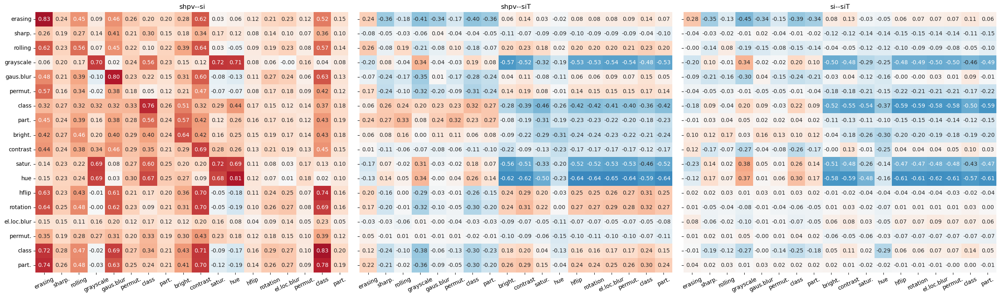


			features.5



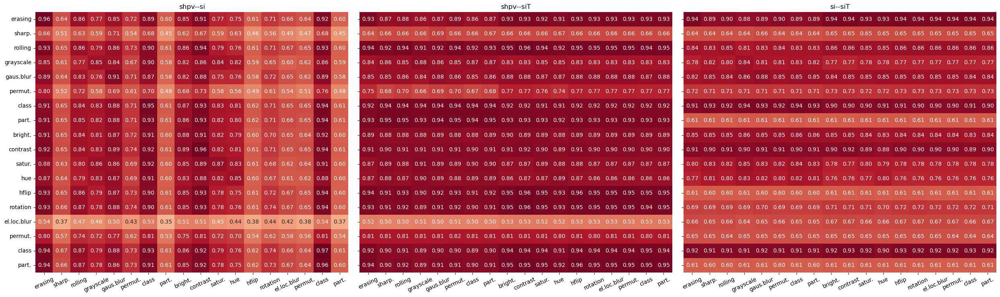


			features.7



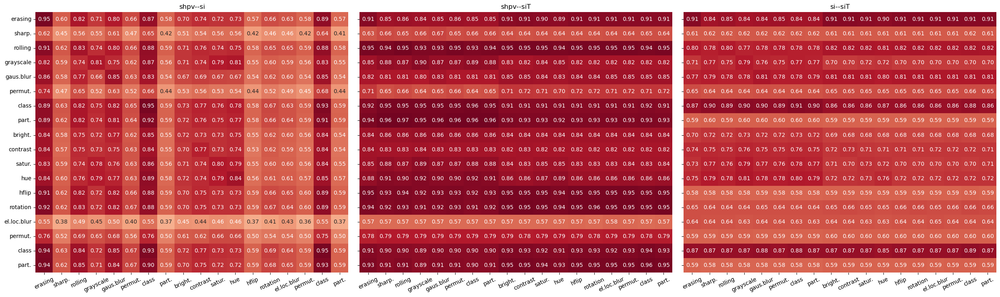


			features.9



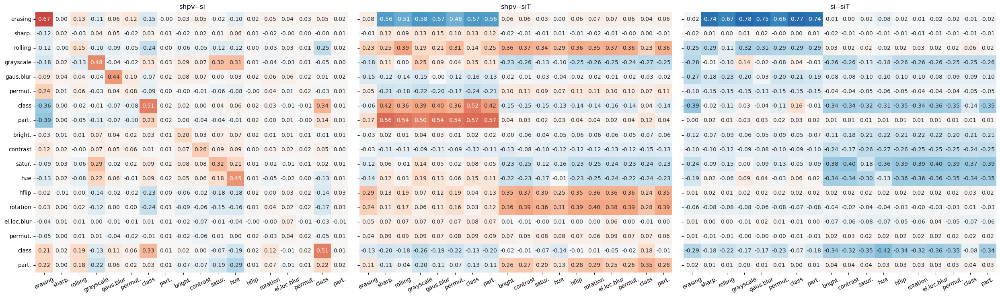


			avgpool



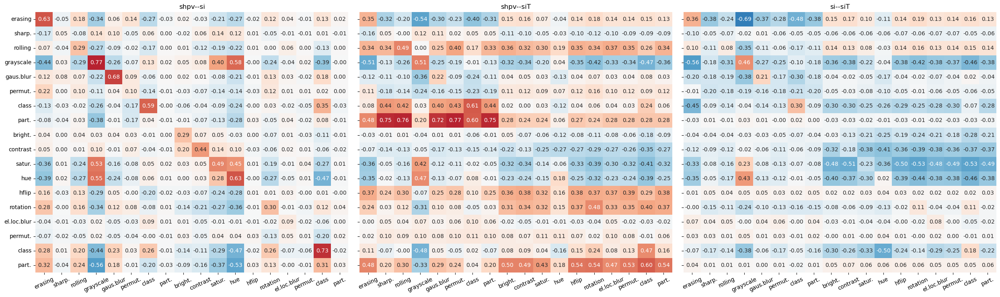


			classifier.2



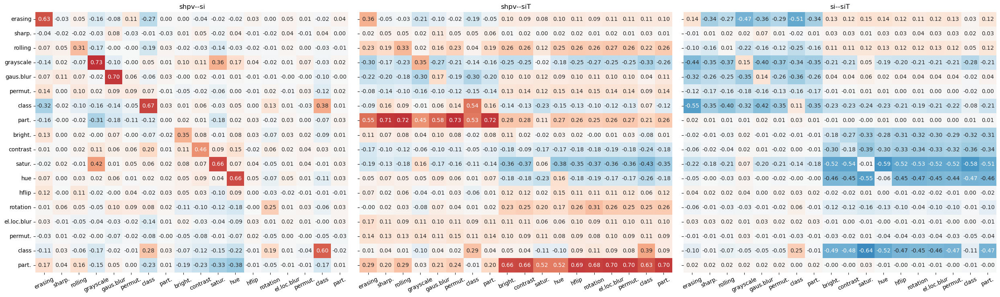


			classifier.5



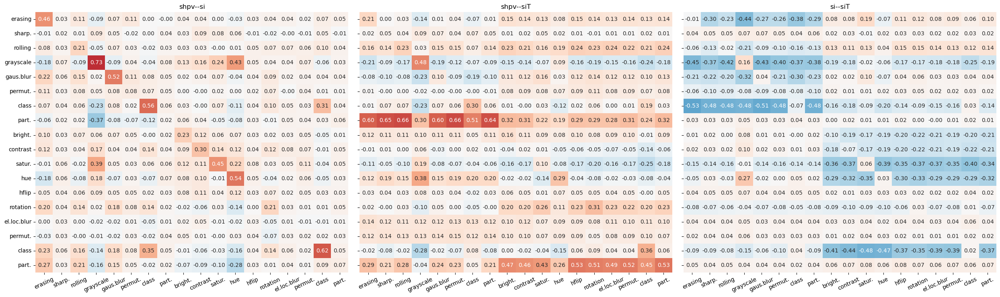


			classifier.6



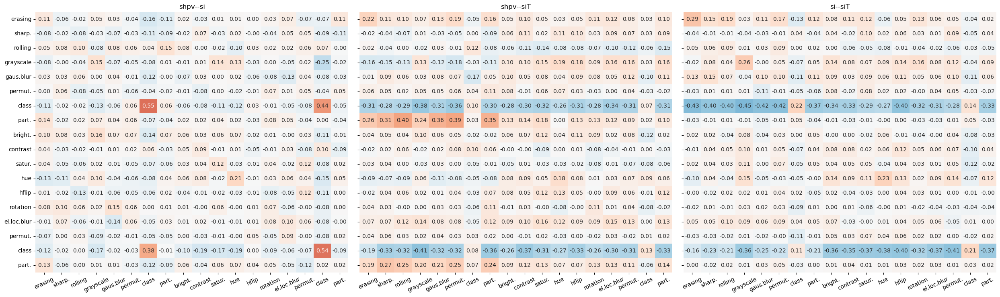

In [14]:
correlation.visualize.plot_paired_correlations_fixed_values(
    alexnet_cross_cormat_means,
    augmentation_and_auxilliary_names,
    alexnet_network_modules,
    cross_values_names_list,
    figsize=figsize_cross_corr,
    plot_colorbar=False,
    show=show,
    cmap=cmap_corr,
)

#### 1.3.2 Histograms of the (space-wise) standard deviations

[[Back to subsection]](#1.3-Cross-correlations-between-paired-sensitivity-values)


			features.2



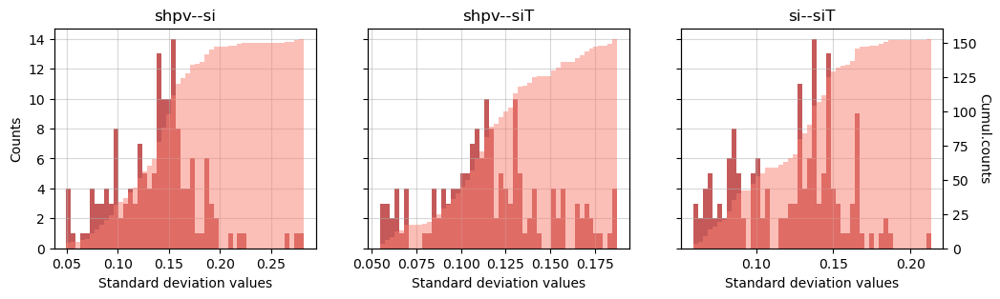


			features.5



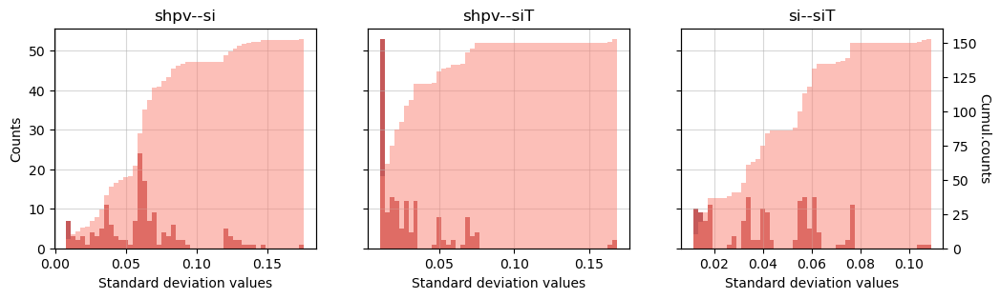


			features.7



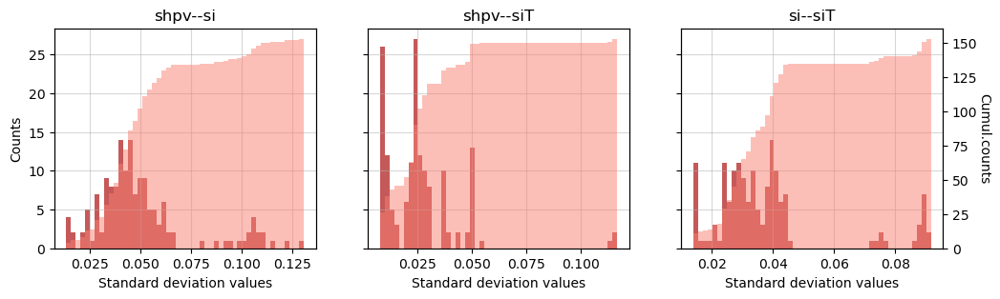


			features.9



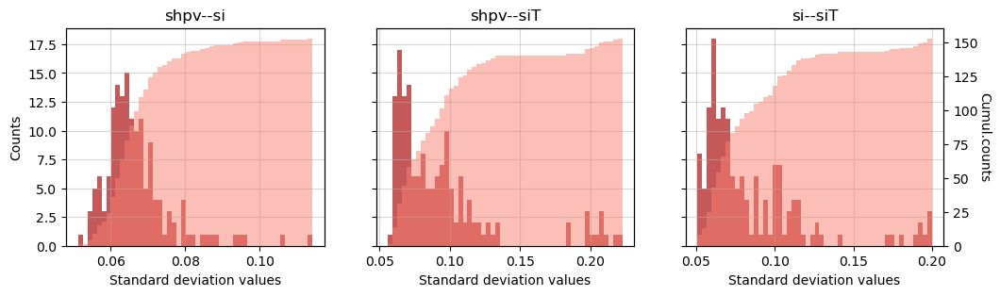


			avgpool



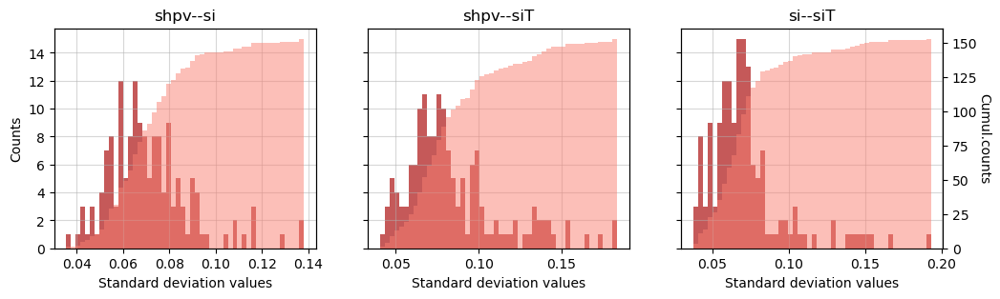

In [15]:
correlation.visualize.plot_hist_std_paired_correlations_fixed_values(
    alexnet_cross_cormat_std,
    augmentation_names,
    alexnet_network_modules,
    cross_values_names_list,
    alexnet_n_conv_modules,
    figsize=figsize_cross_corr_hist,
    show=show,
    color_cumul=color_cumul,
    color_bins=color_bins,
)

#### 1.3.3 Consolidated summary plots

[[Back to subsection]](#1.3-Cross-correlations-between-paired-sensitivity-values)

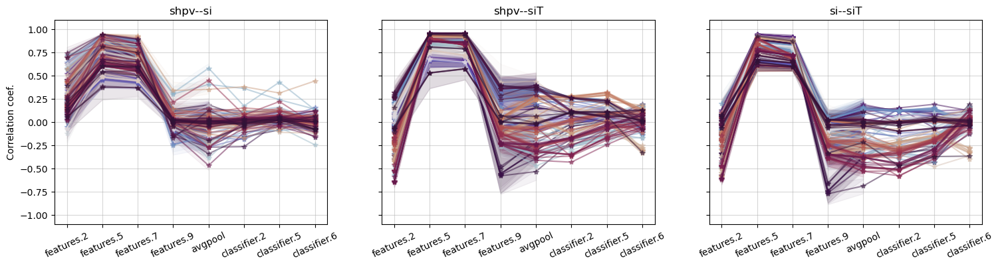

In [16]:
correlation.visualize.plot_consolidated_paired_correlations_fixed_values(
    alexnet_cross_cormat_means,
    alexnet_cross_cormat_std,
    alexnet_network_modules,
    cross_values_names_list,
    figsize=figsize_cross_corr_consolidated,
    show=show,
    cmap=cmap_cross_corr_consolidated,
)

### 1.4 Correlations between sensitivity values and corresponding coefficients of variations

[[$\leftarrow$Prev.subsect.]](#1.3-Cross-correlations-between-paired-sensitivity-values)$\quad$[[Back to section]](#1.-Alexnet)$\quad$

- [1.4.1 Space maps of correlations](#1.4.1-Space-maps-of-correlations)
- [1.4.2 Consolidated summary plots](#1.4.2-Consolidated-summary-plots)

In [17]:
(
    alexnet_corr_vals_dict,
    alexnet_mean_stats,
    alexnet_std_stats,
    augmentation_and_auxilliary_names,
    alexnet_corr_vals_nanmask_dict,
) = correlation.visualize.get_cross_correlations_single_value_fixed_values(
    alexnet_values_fnms_dict,
    os.path.join(notebook_directory_offset, activations_dirname),
    alexnet_network_modules,
    values_names_list_2,
    augmentation_set_numbers_list,
    shpv_group_indices_dict,
    alexnet_n_conv_modules,
    values_cov_pairs_dict,
    cov_values_names_dict,
    cov_values_funcs,
    corr_type=corr_type,
    extract_auxilliary_names=True,
)

#### 1.4.1 Space maps of correlations

[[Back to subsection]](#1.4-Correlations-between-sensitivity-values-and-corresponding-coefficients-of-variations)

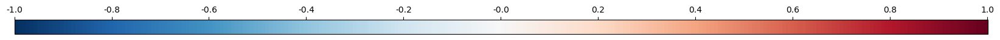


			features.2



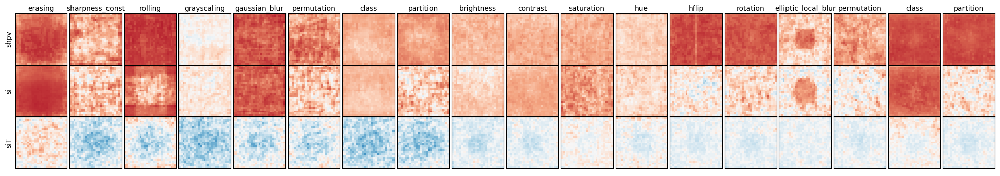


			features.5



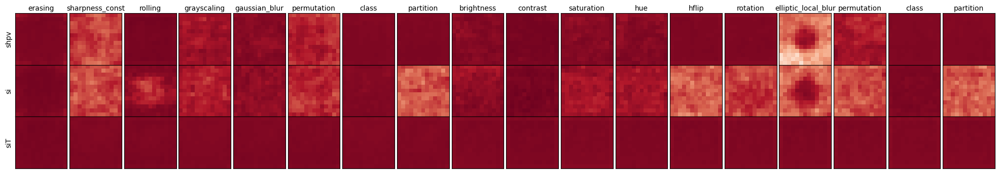


			features.7



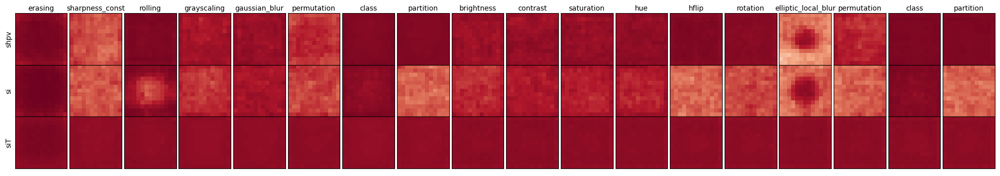


			features.9



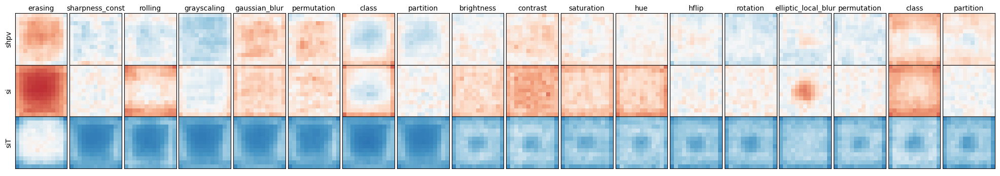


			avgpool



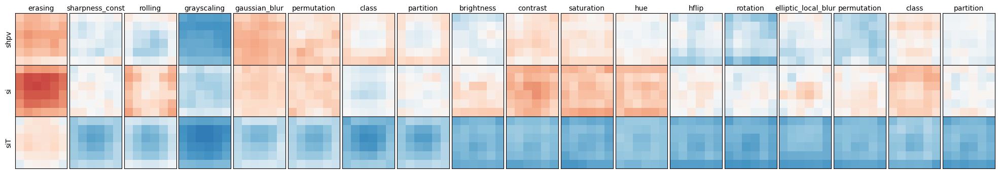


			classifier.2



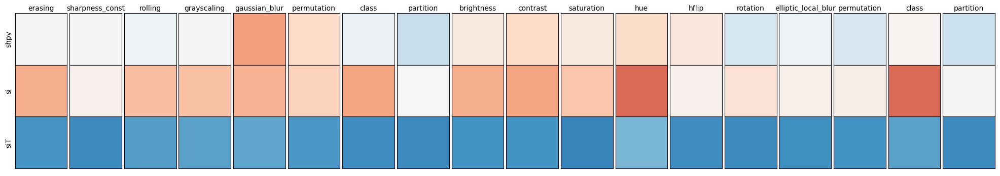


			classifier.5



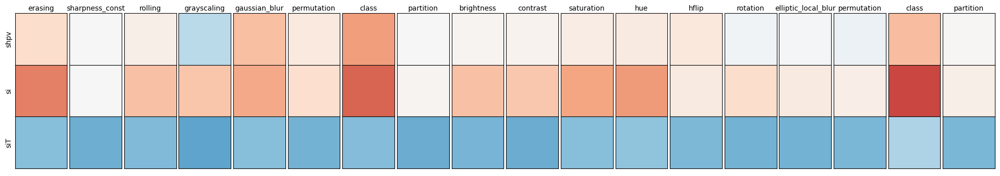


			classifier.6



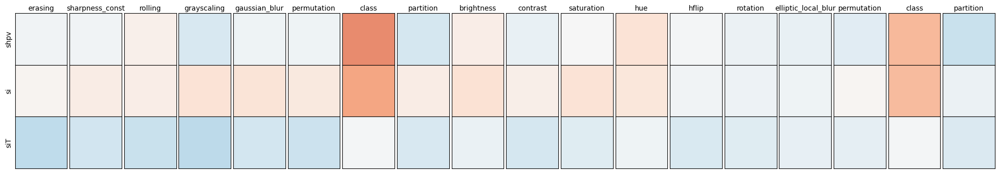

In [18]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{network_name}_{dataset_name}/space_cormaps/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'space_cormaps'


correlation.visualize.plot_cross_correlations_single_value_fixed_values(
    alexnet_corr_vals_dict,
    augmentation_and_auxilliary_names,
    alexnet_network_modules,
    values_names_list_2,
    alexnet_n_conv_modules,
    figsize=figsize_cvs_corr,
    plot_colorbar=plot_colorbar,
    show=show,
    cmap=cmap_corr,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

#### 1.4.2 Consolidated summary plots

[[Back to subsection]](#1.4-Correlations-between-sensitivity-values-and-corresponding-coefficients-of-variations)

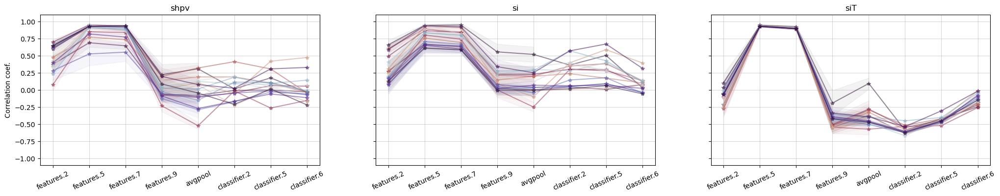

In [19]:
correlation.visualize.plot_consolidated_cross_correlations_single_value_fixed_values(
    alexnet_mean_stats,
    alexnet_std_stats,
    alexnet_network_modules,
    values_names_list_2,
    figsize=figsize_cvs_consolidated,
    show=show,
    cmap=cmap_cvs_consolidated,
)

## 2. ResNet18

[[$\leftarrow$ Prev.part]](#1.-Alexnet) $\qquad$ [[Back to top]](#Navigation) $\qquad$

- [2.1 Setting up the configuration variables](#2.1-Setting-up-the-configuration-variables)
- [2.2 Correlation between pairs of augmentation variables within selected sensitivity values](#2.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)
- [2.3 Cross-correlations between paired sensitivity values](#2.3-Cross-correlations-between-paired-sensitivity-values)
- [2.4 Correlations between sensitivity values and corresponding coefficients of variations](#2.4-Correlations-between-sensitivity-values-and-corresponding-coefficients-of-variations)

### 2.1 Setting up the configuration variables

$\quad$ [[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)

In [13]:
network_name = 'resnet18'
resnet18_network_modules = [
    'maxpool', # conv2d -> BN -> ReLU -> MaxPool2d
    'layer1', # Basic ResNet Block 1
    'layer2', # Basic ResNet Block 2
    'layer3', # Basic ResNet Block 3
    'avgpool', # Basic ResNet Block 1 -> AvgPool
    'fc'
]
resnet18_n_conv_modules = len(
    list(
        filter(
            lambda x: ('maxpool' in x) or ('layer' in x), #or ('avgpool' in x),
            resnet18_network_modules
        )
    )
)

resnet18_values_fnms_dict = preparation.single_unit.extract_massive_values_fnms(
    network_name,
    values_fnm_base,
    augmentation_set_numbers_list,
    prefix=None
);

### 2.2 Correlation between pairs of augmentation variables within selected sensitivity values

[[$\leftarrow$Prev.subsect.]](#2.1-Setting-up-the-configuration-variables)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.3-Cross-correlations-between-paired-sensitivity-values)

- [2.2.1 Space-wise means](#2.2.1-Space-wise-means)
- [2.2.2 Histograms of the (space-wise) standard deviations](#2.2.2-Histograms-of-the-(space-wise)-standard-deviations)
- [2.2.3 Consolidated summary plots](#2.2.3-Consolidated-summary-plots)

In [14]:
resnet18_cormat_means, resnet18_cormat_std, augmentation_names, resnet18_cormat_nans = (
    correlation.visualize.get_paired_correlations_fixed_values(
        resnet18_values_fnms_dict,
        os.path.join(notebook_directory_offset, activations_dirname),
        resnet18_network_modules,
        values_names_list,
        augmentation_set_numbers_list,
        shpv_group_indices_dict,
        resnet18_n_conv_modules,
        corr_type=corr_type,
        extract_auxilliary_names=False,
        nan_mask_policy='any',
    )
)

#### 2.2.1 Space-wise means

[[Back to subsection]](#2.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)

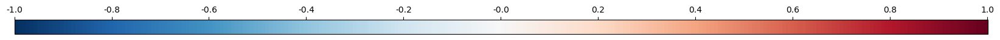


			maxpool



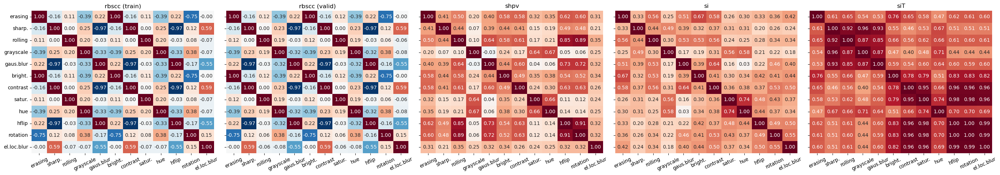


			layer1



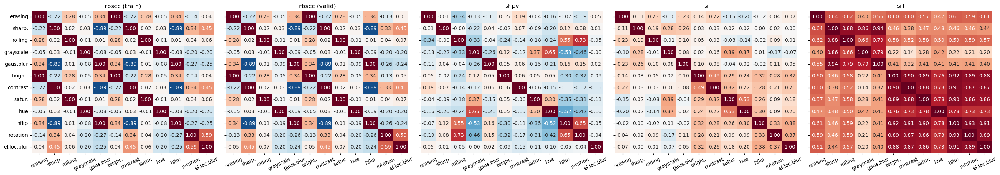


			layer2



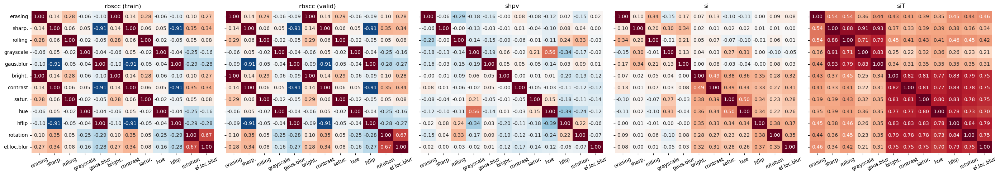


			layer3



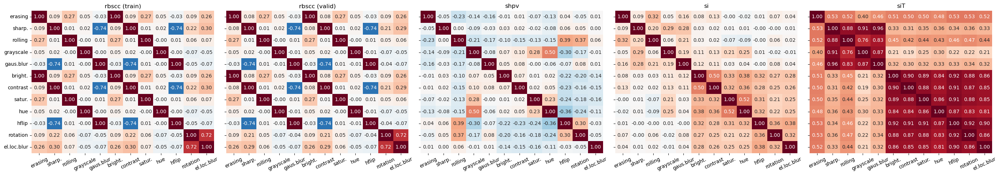


			avgpool



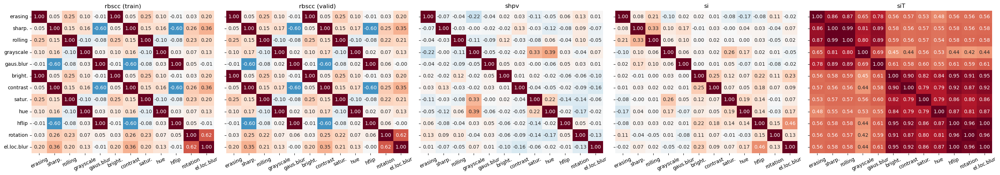


			fc



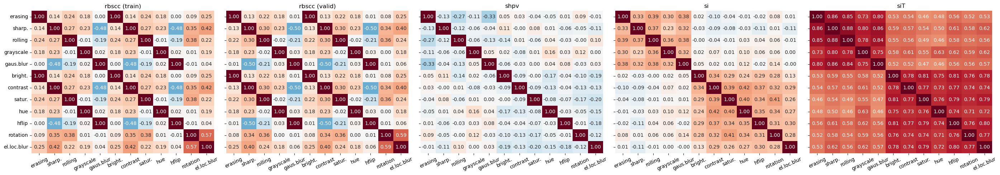

In [15]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{network_name}_{dataset_name}/spacewise_mean_cormat/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'spacewise_mean_cormat'


correlation.visualize.plot_paired_correlations_fixed_values(
    resnet18_cormat_means,
    augmentation_names,
    resnet18_network_modules,
    values_names_list,
    figsize=figsize_corr,
    plot_colorbar=True,
    show=show,
    cmap=cmap_corr,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

#### 2.2.2 Histograms of the (space-wise) standard deviations

[[Back to subsection]](#2.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)


			maxpool



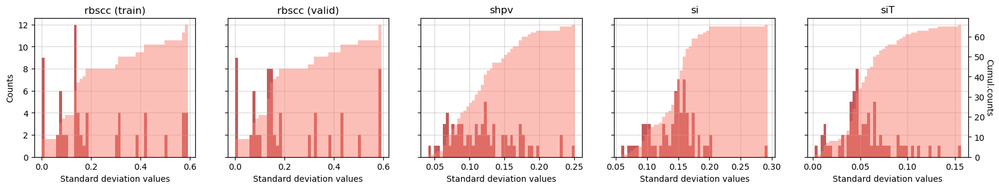


			layer1



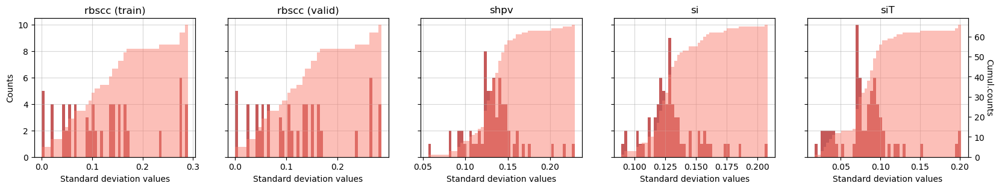


			layer2



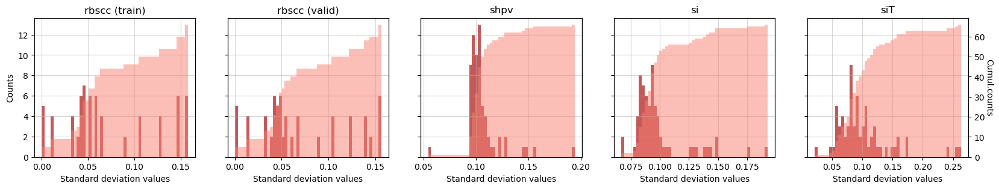


			layer3



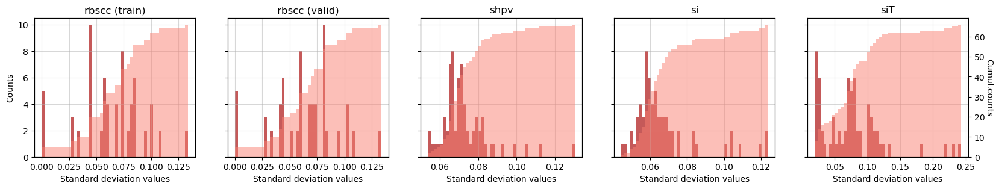

In [16]:
correlation.visualize.plot_hist_std_paired_correlations_fixed_values(
    resnet18_cormat_std,
    augmentation_names,
    resnet18_network_modules,
    values_names_list,
    resnet18_n_conv_modules,
    figsize=figsize_corr_hist,
    show=show,
    color_cumul=color_cumul,
    color_bins=color_bins,
)

#### 2.2.3 Consolidated summary plots

[[Back to subsection]](#2.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)

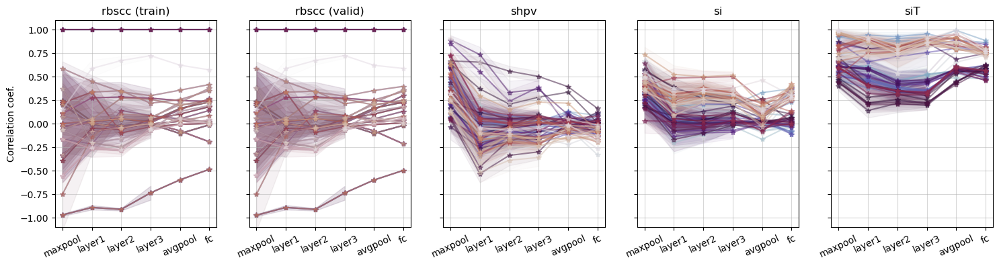

In [17]:
correlation.visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_cormat_means,
    resnet18_cormat_std,
    resnet18_network_modules,
    values_names_list,
    figsize=figsize_corr_consolidated,
    show=show,
    cmap=cmap_corr_consolidated,
)

### 2.3 Cross-correlations between paired sensitivity values 

[[$\leftarrow$Prev.subsect.]](#2.2-Correlation-between-pairs-of-augmentation-variables-within-selected-sensitivity-values)$\quad$[[Back to section]](#2.-ResNet18)$\quad$[[Next subsect.$\to$]](#2.4-Correlations-between-sensitivity-values-and-corresponding-coefficients-of-variations)

- [2.3.1 Space-wise means](#2.3.1-Space-wise-means)
- [2.3.2 Histograms of the (space-wise) standard deviations](#2.3.2-Histograms-of-the-(space-wise)-standard-deviations)
- [2.3.3 Consolidated summary plots](#2.3.3-Consolidated-summary-plots)

In [25]:
(
    resnet18_cross_cormat_means,
    resnet18_cross_cormat_std,
    augmentation_and_auxilliary_names,
    cross_values_names_list,
    resnet18_cross_cormat_nanmask,
) = correlation.visualize.get_paired_cross_correlations_fixed_values(
    resnet18_values_fnms_dict,
    os.path.join(notebook_directory_offset, activations_dirname),
    resnet18_network_modules,
    values_names_list_2,
    augmentation_set_numbers_list,
    shpv_group_indices_dict,
    resnet18_n_conv_modules,
    corr_type=corr_type,
    extract_auxilliary_names=True,
)

#### 2.3.1 Space-wise means

[[Back to subsection]](#3.3-Cross-correlations-between-paired-sensitivity-values)


			maxpool



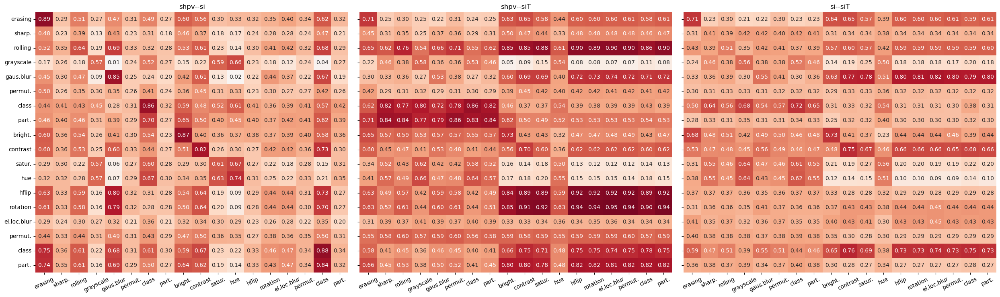


			layer1



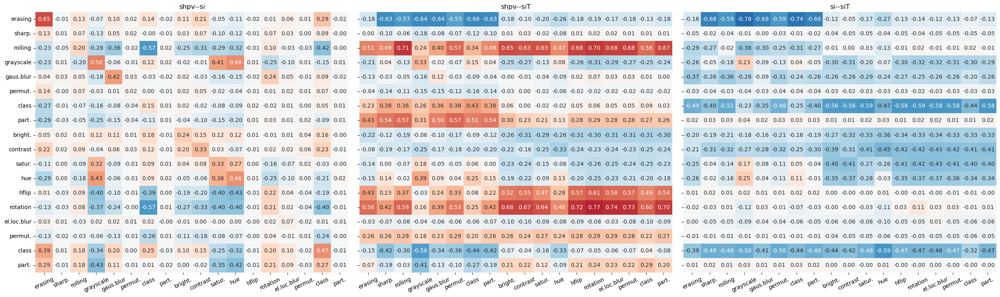


			layer2



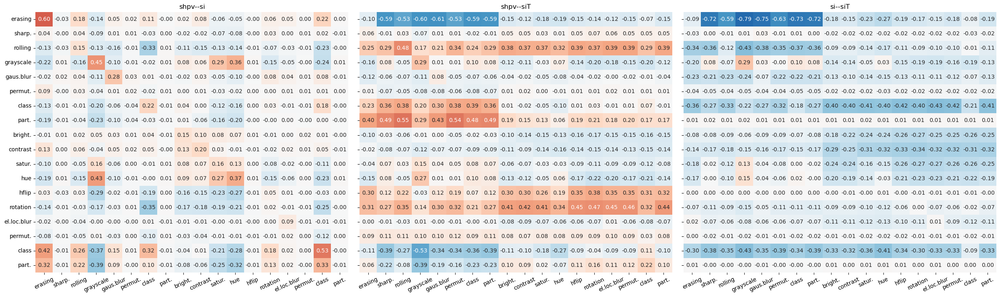


			layer3



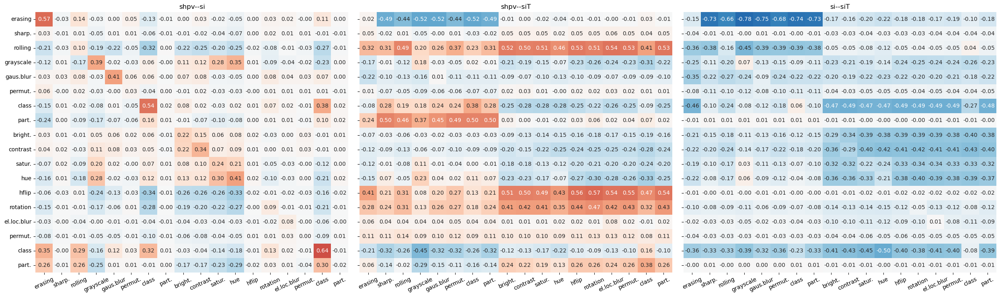


			avgpool



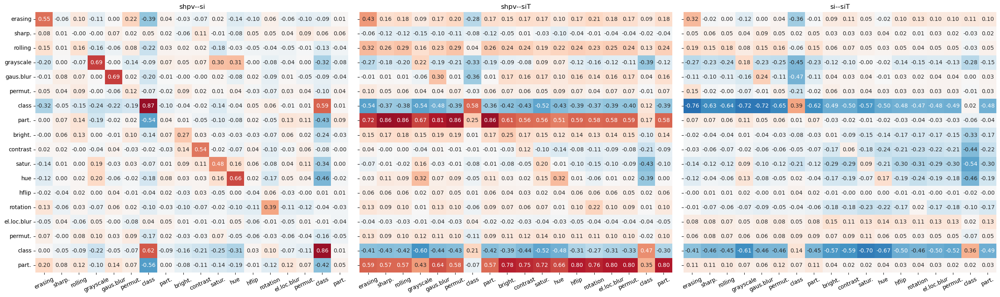


			fc



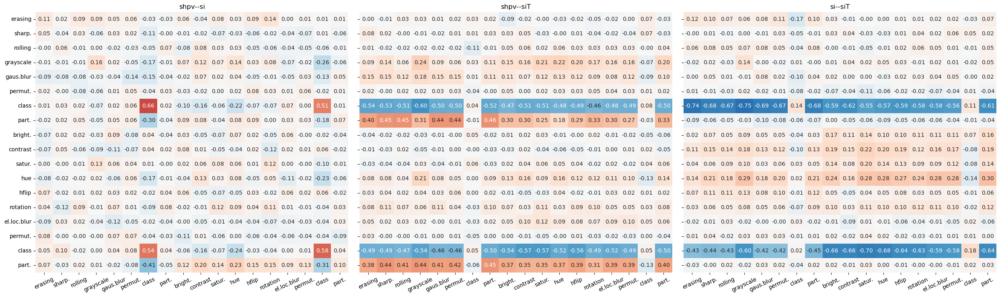

In [26]:
correlation.visualize.plot_paired_correlations_fixed_values(
    resnet18_cross_cormat_means,
    augmentation_and_auxilliary_names,
    resnet18_network_modules,
    cross_values_names_list,
    figsize=figsize_cross_corr,
    plot_colorbar=False,
    show=show,
    cmap=cmap_corr,
)

#### 2.3.2 Histograms of the (space-wise) standard deviations

[[Back to subsection]](#2.3-Cross-correlations-between-paired-sensitivity-values)


			maxpool



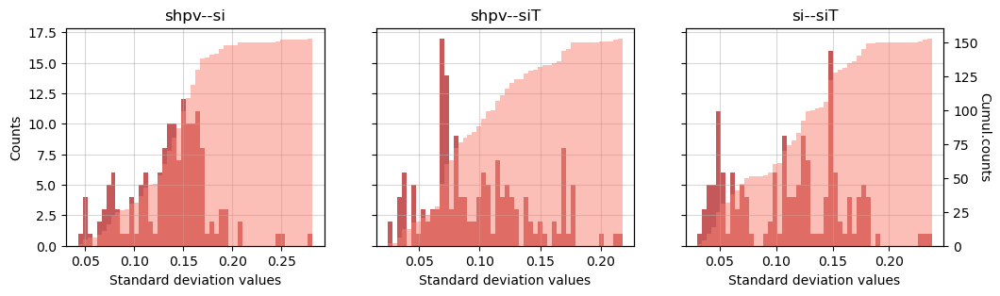


			layer1



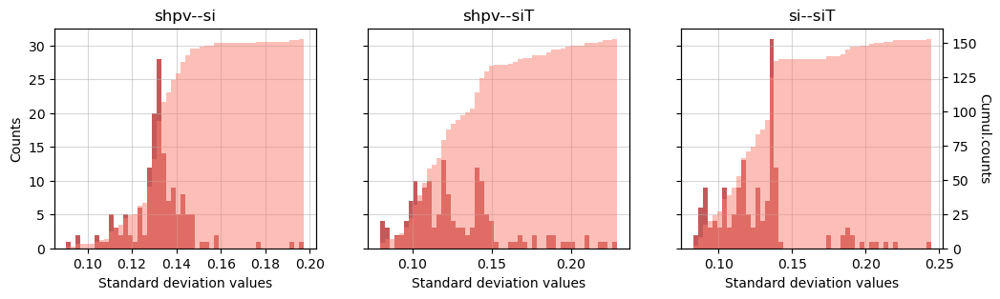


			layer2



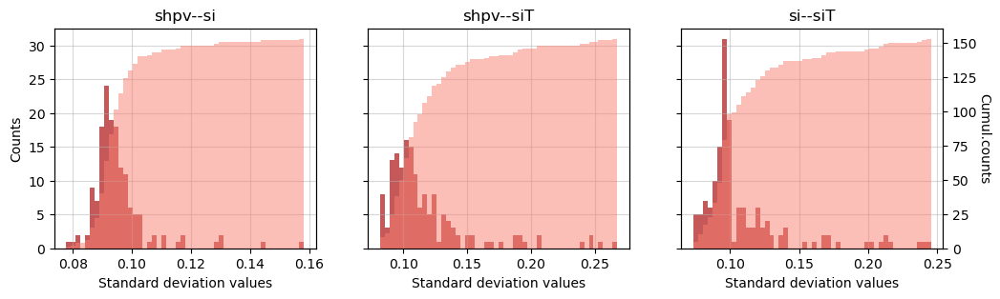


			layer3



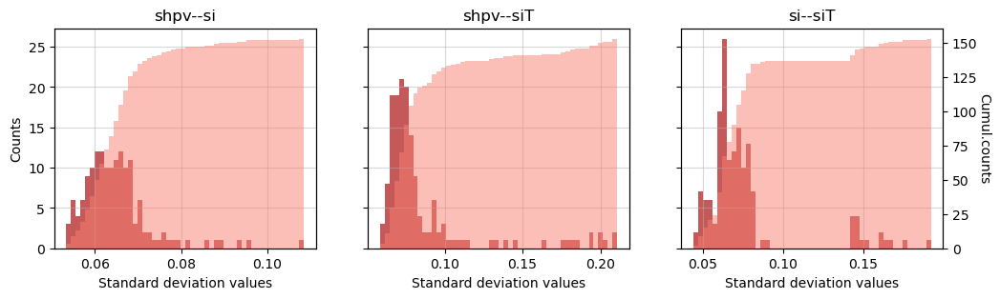

In [27]:
correlation.visualize.plot_hist_std_paired_correlations_fixed_values(
    resnet18_cross_cormat_std,
    augmentation_names,
    resnet18_network_modules,
    cross_values_names_list,
    resnet18_n_conv_modules,
    figsize=figsize_cross_corr_hist,
    show=show,
    color_cumul=color_cumul,
    color_bins=color_bins,
)

#### 2.3.3 Consolidated summary plots

[[Back to subsection]](#2.3-Cross-correlations-between-paired-sensitivity-values)

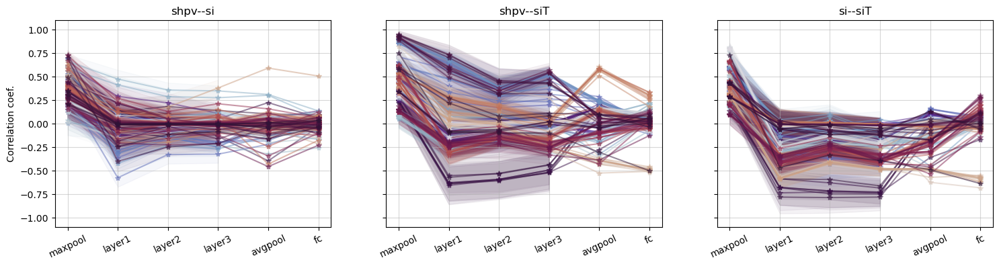

In [28]:
correlation.visualize.plot_consolidated_paired_correlations_fixed_values(
    resnet18_cross_cormat_means,
    resnet18_cross_cormat_std,
    resnet18_network_modules,
    cross_values_names_list,
    figsize=figsize_cross_corr_consolidated,
    show=show,
    cmap=cmap_cross_corr_consolidated,
)

### 2.4 Correlations between sensitivity values and corresponding coefficients of variations

[[$\leftarrow$Prev.subsect.]](#2.3-Cross-correlations-between-paired-sensitivity-values)$\quad$[[Back to section]](#2.-ResNet18)$\quad$

- [2.4.1 Space maps of correlations](#2.4.1-Space-maps-of-correlations)
- [2.4.2 Consolidated summary plots](#2.4.2-Consolidated-summary-plots)

In [29]:
(
    resnet18_corr_vals_dict,
    resnet18_mean_stats,
    resnet18_std_stats,
    augmentation_and_auxilliary_names,
    resnet18_corr_vals_nanmask_dict,
) = correlation.visualize.get_cross_correlations_single_value_fixed_values(
    resnet18_values_fnms_dict,
    os.path.join(notebook_directory_offset, activations_dirname),
    resnet18_network_modules,
    values_names_list_2,
    augmentation_set_numbers_list,
    shpv_group_indices_dict,
    resnet18_n_conv_modules,
    values_cov_pairs_dict,
    cov_values_names_dict,
    cov_values_funcs,
    corr_type=corr_type,
    extract_auxilliary_names=True,
)

#### 2.4.1 Space maps of correlations

[[Back to subsection]](#2.4-Correlations-between-sensitivity-values-and-corresponding-coefficients-of-variations)

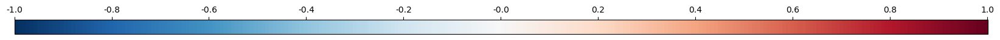


			maxpool



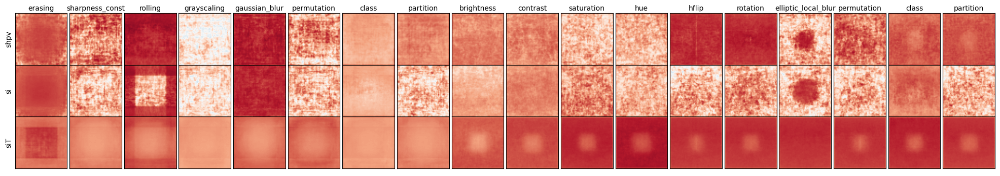


			layer1



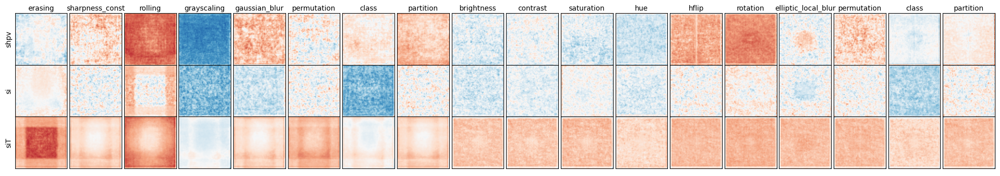


			layer2



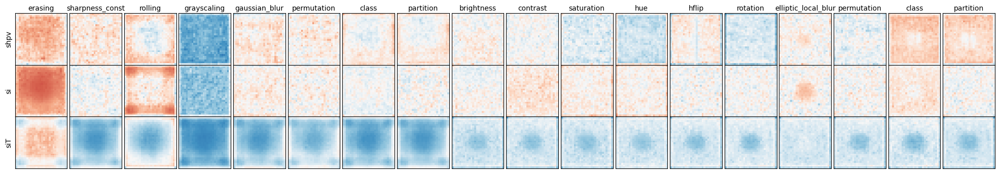


			layer3



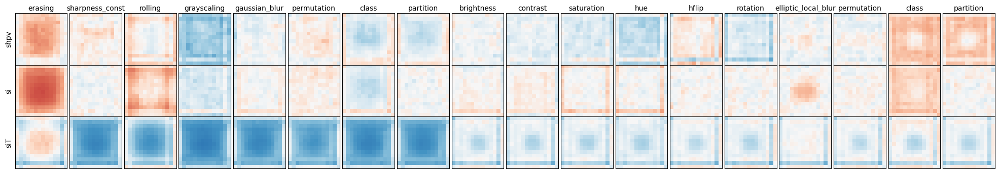


			avgpool



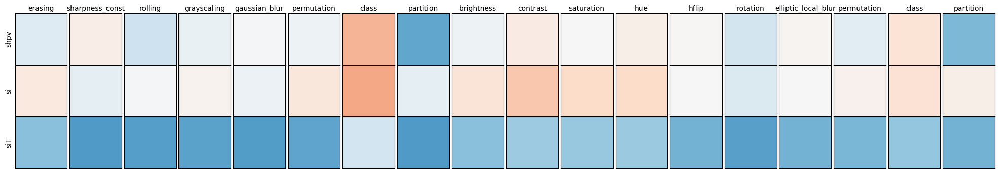


			fc



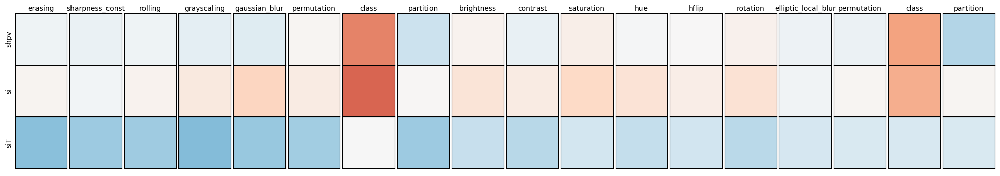

In [30]:
save_dirname = os.path.join(
    notebook_directory_offset,
    f'../results/{network_name}_{dataset_name}/space_cormaps/'
)
os.makedirs(save_dirname, exist_ok=True)
save_filename_base = f'space_cormaps'


correlation.visualize.plot_cross_correlations_single_value_fixed_values(
    resnet18_corr_vals_dict,
    augmentation_and_auxilliary_names,
    resnet18_network_modules,
    values_names_list_2,
    resnet18_n_conv_modules,
    figsize=figsize_cvs_corr,
    plot_colorbar=plot_colorbar,
    show=show,
    cmap=cmap_corr,
    save_dirname=save_dirname,
    save_filename_base=save_filename_base,
)

#### 2.4.2 Consolidated summary plots

[[Back to subsection]](#2.4-Correlations-between-sensitivity-values-and-corresponding-coefficients-of-variations)

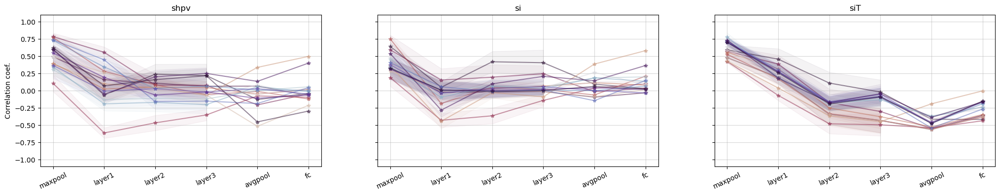

In [31]:
correlation.visualize.plot_consolidated_cross_correlations_single_value_fixed_values(
    resnet18_mean_stats,
    resnet18_std_stats,
    resnet18_network_modules,
    values_names_list_2,
    figsize=figsize_cvs_consolidated,
    show=show,
    cmap=cmap_cvs_consolidated,
)